In [1]:
model_checkpoint = "google/efficientnet-b0" # pre-trained model from which to fine-tune
batch_size = 32 # batch size for training and evaluation

In [2]:
%%capture
!sudo apt -qq install git-lfs
!git config --global credential.helper store

In [4]:
from datasets import load_dataset

dataset = load_dataset("imagefolder", data_dir=r"D:\research_cnn\chest_xray")

In [5]:
import evaluate

metric = evaluate.load("accuracy")

In [6]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image'],
        num_rows: 10432
    })
    validation: Dataset({
        features: ['image'],
        num_rows: 32
    })
    test: Dataset({
        features: ['image'],
        num_rows: 1248
    })
})

In [7]:
example = dataset["train"][10]
example

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=L size=1724x1581>}

In [8]:
dataset["train"].features

{'image': Image(mode=None, decode=True)}

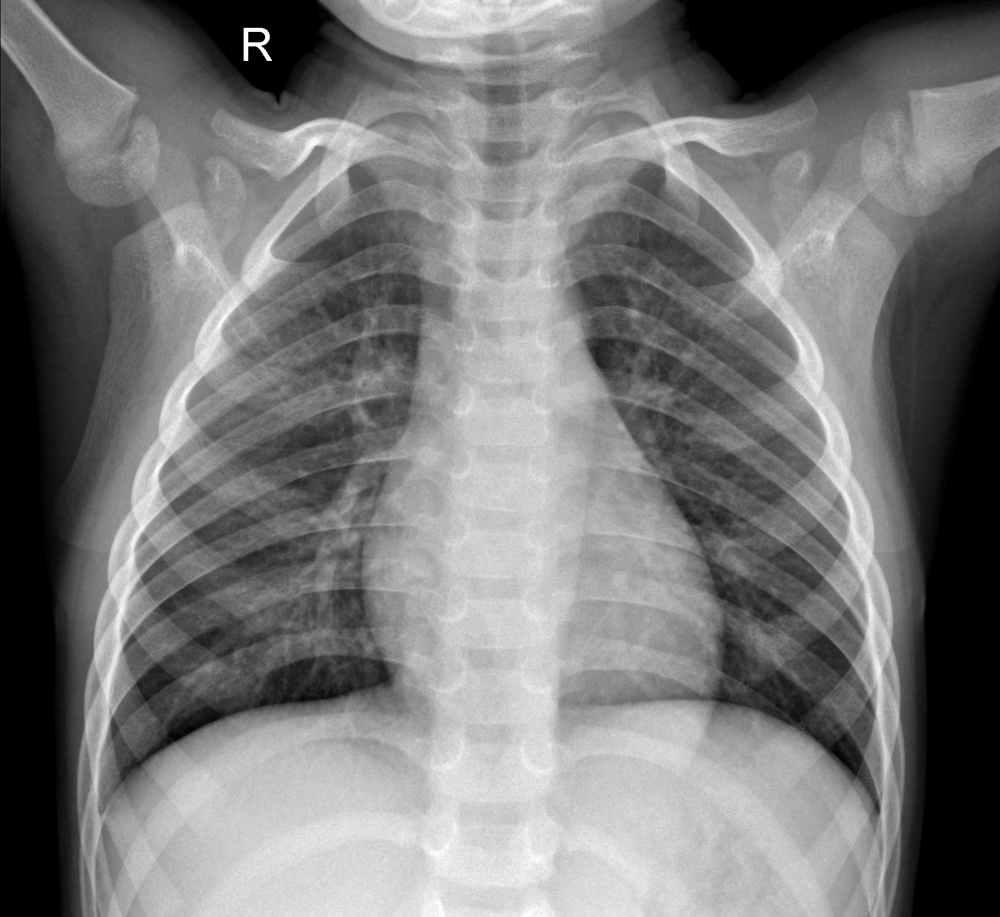

In [9]:
example['image']

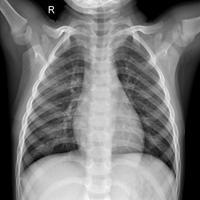

In [10]:
example['image'].resize((200, 200))

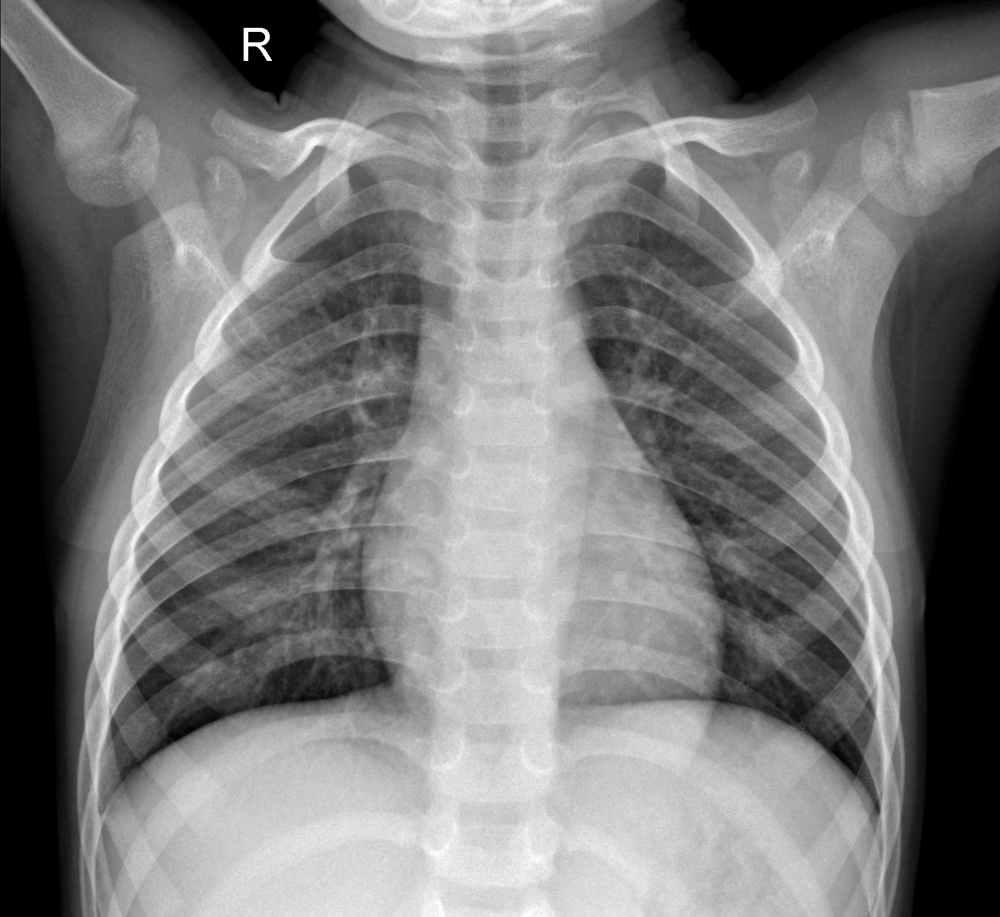

In [11]:
example['image']

In [12]:
dataset["train"].features["image"]

Image(mode=None, decode=True)

In [23]:
# Check if labels exist, if not reload the dataset properly
if "label" not in dataset["train"].features:
    print("Reloading dataset with explicit structure...")
    from datasets import load_dataset

    # Try loading with explicit data_files parameter
    dataset = load_dataset(
        "imagefolder",
        data_files={
            "train": "chest_xray/train/**/*.jpeg",
            "test": "chest_xray/test/**/*.jpeg",
            "val": "chest_xray/val/**/*.jpeg"
        }
    )

# Now get the labels
labels = dataset["train"].features["label"].names
label2id = {label: i for i, label in enumerate(labels)}
id2label = {i: label for i, label in enumerate(labels)}

print("Labels:", labels)
print("label2id:", label2id)
print("id2label:", id2label)

Reloading dataset with explicit structure...


Generating train split: 5216 examples [00:00, 6326.64 examples/s]
Generating test split: 624 examples [00:00, 5612.14 examples/s]
Generating val split: 16 examples [00:00, 2237.93 examples/s]


Labels: ['NORMAL', 'PNEUMONIA']
label2id: {'NORMAL': 0, 'PNEUMONIA': 1}
id2label: {0: 'NORMAL', 1: 'PNEUMONIA'}


In [24]:
labels = dataset["train"].features["label"].names
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label
    #id2label[2]

In [62]:
from transformers import AutoImageProcessor

image_processor  = AutoImageProcessor.from_pretrained(model_checkpoint)
image_processor

EfficientNetImageProcessor {
  "crop_size": {
    "height": 289,
    "width": 289
  },
  "do_center_crop": false,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "EfficientNetImageProcessor",
  "image_std": [
    0.47853944,
    0.4732864,
    0.47434163
  ],
  "include_top": true,
  "resample": 0,
  "rescale_factor": 0.00392156862745098,
  "rescale_offset": false,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [63]:
from torchvision.transforms import (
    CenterCrop,
    Compose,
    Normalize,
    RandomHorizontalFlip,
    RandomResizedCrop,
    Resize,
    ToTensor,
)

normalize = Normalize(mean=image_processor.image_mean, std=image_processor.image_std)
if "height" in image_processor.size:
    size = (image_processor.size["height"], image_processor.size["width"])
    crop_size = size
    max_size = None
elif "shortest_edge" in image_processor.size:
    size = image_processor.size["shortest_edge"]
    crop_size = (size, size)
    max_size = image_processor.size.get("longest_edge")

train_transforms = Compose(
        [
            RandomResizedCrop(crop_size),
            RandomHorizontalFlip(),
            ToTensor(),
            normalize,
        ]
    )

val_transforms = Compose(
        [
            Resize(size),
            CenterCrop(crop_size),
            ToTensor(),
            normalize,
        ]
    )

def preprocess_train(example_batch):
    """Apply train_transforms across a batch."""
    example_batch["pixel_values"] = [
        train_transforms(image.convert("RGB")) for image in example_batch["image"]
    ]
    return example_batch

def preprocess_val(example_batch):
    """Apply val_transforms across a batch."""
    example_batch["pixel_values"] = [val_transforms(image.convert("RGB")) for image in example_batch["image"]]
    return example_batch

In [64]:
# split up training into training + validation
splits = dataset["train"].train_test_split(test_size=0.1)
train_ds = splits['train']
val_ds = splits['test']

In [65]:
train_ds.set_transform(preprocess_train)
val_ds.set_transform(preprocess_val)

In [66]:
train_ds[0]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=L size=1636x1074>,
 'label': 0,
 'pixel_values': tensor([[[-0.9234, -0.8824, -0.8496,  ...,  0.0436,  0.0600,  0.0436],
          [-0.9397, -0.8824, -0.8578,  ...,  0.0764,  0.0846,  0.0928],
          [-0.8250, -0.9152, -0.8742,  ...,  0.1420,  0.1256,  0.1502],
          ...,
          [-1.0135, -1.0135, -1.0135,  ...,  0.5681,  0.5927,  0.6009],
          [-1.0135, -1.0135, -1.0135,  ...,  0.5927,  0.6009,  0.5845],
          [-1.0135, -1.0135, -1.0135,  ...,  0.5763,  0.5681,  0.5681]],
 
         [[-0.8723, -0.8309, -0.7978,  ...,  0.1054,  0.1220,  0.1054],
          [-0.8889, -0.8309, -0.8060,  ...,  0.1385,  0.1468,  0.1551],
          [-0.7729, -0.8640, -0.8226,  ...,  0.2048,  0.1883,  0.2131],
          ...,
          [-0.9635, -0.9635, -0.9635,  ...,  0.6357,  0.6605,  0.6688],
          [-0.9635, -0.9635, -0.9635,  ...,  0.6605,  0.6688,  0.6523],
          [-0.9635, -0.9635, -0.9635,  ...,  0.6440,  0.6357,  0.6357]]

In [67]:
from transformers import AutoModelForImageClassification, TrainingArguments, Trainer

model = AutoModelForImageClassification.from_pretrained(
    model_checkpoint,
    label2id=label2id,
    id2label=id2label,
    ignore_mismatched_sizes = True, # provide this in case you're planning to fine-tune an already fine-tuned checkpoint
)

Some weights of EfficientNetForImageClassification were not initialized from the model checkpoint at google/efficientnet-b0 and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([1000, 1280]) in the checkpoint and torch.Size([2, 1280]) in the model instantiated
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
model_name = model_checkpoint.split("/")[-1]

args = TrainingArguments(
    f"{model_name}-finetuned-chest-xray-pneumonia",
    remove_unused_columns=False,
    eval_strategy = "epoch",
    save_strategy = "epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    gradient_accumulation_steps=4,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=3,
    warmup_ratio=0.1,
    logging_steps=10,
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",
    push_to_hub=False,  # Set to True only if you're logged in to Hugging Face Hub
)

In [ ]:
import numpy as np

# the compute_metrics function takes a Named Tuple as input:
# predictions, which are the logits of the model as Numpy arrays,
# and label_ids, which are the ground-truth labels as Numpy arrays.
def compute_metrics(eval_pred):
    """Computes accuracy on a batch of predictions"""
    predictions = np.argmax(eval_pred.predictions, axis=1)
    return metric.compute(predictions=predictions, references=eval_pred.label_ids)

In [ ]:
import torch

def collate_fn(examples):
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    labels = torch.tensor([example["label"] for example in examples])
    return {"pixel_values": pixel_values, "labels": labels}

In [ ]:
trainer = Trainer(
    model,
    args,
    train_dataset=train_ds,
    eval_dataset=val_ds,
    tokenizer=image_processor,
    compute_metrics=compute_metrics,
    data_collator=collate_fn,
)

In [ ]:
train_results = trainer.train()
# rest is optional but nice to have
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()

In [ ]:
metrics = trainer.evaluate()
# some nice to haves:
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

In [ ]:
trainer.push_to_hub()

In [68]:
# from PIL import Image
# import requests
#
# url = 'D:\research_cnn\chest_xray\test\NORMAL\IM-0003-0001.jpeg'
# image = Image.open(requests.get(url, stream=True).raw)
# image

from PIL import Image

# Relative path from your workspace root
image_path = r'chest_xray\test\NORMAL\IM-0003-0001.jpeg'

# Open the image directly
image = Image.open(image_path)

In [69]:
# ============================================================================
# COMPREHENSIVE MODEL EVALUATION WITH ALL METRICS, GRAPHS, AND CHARTS
# ============================================================================

import numpy as np
import evaluate
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import pandas as pd
import time
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for better-looking plots
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("Loading evaluation metrics...")
# Load all required metrics
accuracy_metric = evaluate.load("accuracy")
precision_metric = evaluate.load("precision")
recall_metric = evaluate.load("recall")
f1_metric = evaluate.load("f1")

# Get predictions on test set
print("Evaluating model on test set...")
test_dataset = dataset["test"]
test_dataset.set_transform(preprocess_val)

# Measure inference time and get predictions
start_time = time.time()
predictions = trainer.predict(test_dataset)
inference_time = time.time() - start_time

# Extract predictions and labels
pred_logits = predictions.predictions
pred_labels = np.argmax(pred_logits, axis=1)
true_labels = predictions.label_ids
test_loss = predictions.metrics['test_loss']

# Get prediction probabilities for ROC curve
from scipy.special import softmax
pred_probs = softmax(pred_logits, axis=1)

# Calculate all metrics
accuracy = accuracy_metric.compute(predictions=pred_labels, references=true_labels)['accuracy']
precision = precision_metric.compute(predictions=pred_labels, references=true_labels, average='binary')['precision']
recall = recall_metric.compute(predictions=pred_labels, references=true_labels, average='binary')['recall']
f1 = f1_metric.compute(predictions=pred_labels, references=true_labels, average='binary')['f1']

# Get training time from trainer state
training_time = train_results.metrics['train_runtime']

# Create results dictionary
results = {
    'Model': 'EfficientNet-B0',
    'Accuracy': accuracy,
    'F1_Score': f1,
    'Precision': precision,
    'Recall': recall,
    'Test_Loss': test_loss,
    'Training_Time_s': training_time
}

# Display results
print("\n" + "="*70)
print(" "*20 + "MODEL EVALUATION RESULTS")
print("="*70)
for key, value in results.items():
    if key == 'Model':
        print(f"{key:20s}: {value}")
    elif key == 'Training_Time_s':
        print(f"{key:20s}: {value:.2f} seconds ({value/60:.2f} minutes)")
    else:
        print(f"{key:20s}: {value:.4f} ({value*100:.2f}%)")
print("="*70)

# Create a DataFrame for easy viewing
results_df = pd.DataFrame([results])
print("\nResults as DataFrame:")
print(results_df.to_string(index=False))

# Save results to CSV
results_df.to_csv('model_evaluation_results.csv', index=False)
print("\n✅ Results saved to 'model_evaluation_results.csv'")

Loading evaluation metrics...


D:\research_cnn\.venv\Lib\site-packages\torch\utils\data\dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Evaluating model on test set...

                    MODEL EVALUATION RESULTS
Model               : EfficientNet-B0
Accuracy            : 0.8317 (83.17%)
F1_Score            : 0.8766 (87.66%)
Precision           : 0.8091 (80.91%)
Recall              : 0.9564 (95.64%)
Test_Loss           : 0.3790 (37.90%)
Training_Time_s     : 2186.93 seconds (36.45 minutes)

Results as DataFrame:
          Model  Accuracy  F1_Score  Precision  Recall  Test_Loss  Training_Time_s
EfficientNet-B0  0.831731  0.876616   0.809111 0.95641    0.37895         2186.928

✅ Results saved to 'model_evaluation_results.csv'


In [71]:
# ============================================================================
# DETAILED CLASSIFICATION REPORT
# ============================================================================

print("\n" + "="*70)
print(" "*20 + "DETAILED CLASSIFICATION REPORT")
print("="*70)
print(classification_report(true_labels, pred_labels,
                          target_names=list(id2label.values()),
                          digits=4))

# Confusion Matrix
print("\n" + "="*70)
print(" "*25 + "CONFUSION MATRIX")
print("="*70)
cm = confusion_matrix(true_labels, pred_labels)
cm_df = pd.DataFrame(cm,
                     index=[f'True {label}' for label in id2label.values()],
                     columns=[f'Pred {label}' for label in id2label.values()])
print(cm_df)

# Calculate per-class metrics
print("\n" + "="*70)
print(" "*25 + "PER-CLASS METRICS")
print("="*70)
for i, label_name in id2label.items():
    mask = true_labels == i
    class_acc = (pred_labels[mask] == true_labels[mask]).mean()
    class_count = mask.sum()
    print(f"{label_name:15s}: Accuracy = {class_acc:.4f} ({class_acc*100:.2f}%) | {class_count} samples")


                    DETAILED CLASSIFICATION REPORT
              precision    recall  f1-score   support

      NORMAL     0.8957    0.6239    0.7355       234
   PNEUMONIA     0.8091    0.9564    0.8766       390

    accuracy                         0.8317       624
   macro avg     0.8524    0.7902    0.8061       624
weighted avg     0.8416    0.8317    0.8237       624


                         CONFUSION MATRIX
                Pred NORMAL  Pred PNEUMONIA
True NORMAL             146              88
True PNEUMONIA           17             373

                         PER-CLASS METRICS
NORMAL         : Accuracy = 0.6239 (62.39%) | 234 samples
PNEUMONIA      : Accuracy = 0.9564 (95.64%) | 390 samples


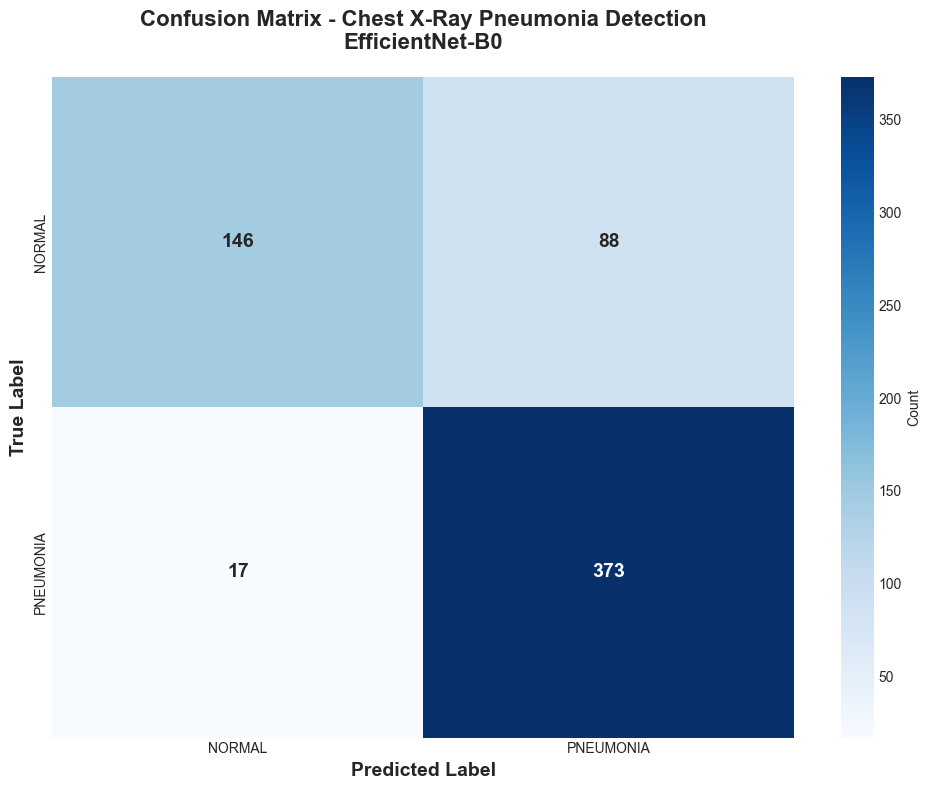

✅ Confusion matrix saved to 'confusion_matrix.png'


In [72]:
# ============================================================================
# VISUALIZATION 1: CONFUSION MATRIX HEATMAP
# ============================================================================

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(id2label.values()),
            yticklabels=list(id2label.values()),
            cbar_kws={'label': 'Count'},
            ax=ax,
            annot_kws={'size': 14, 'weight': 'bold'})

plt.title('Confusion Matrix - Chest X-Ray Pneumonia Detection\nEfficientNet-B0',
          fontsize=16, fontweight='bold', pad=20)
plt.ylabel('True Label', fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Confusion matrix saved to 'confusion_matrix.png'")

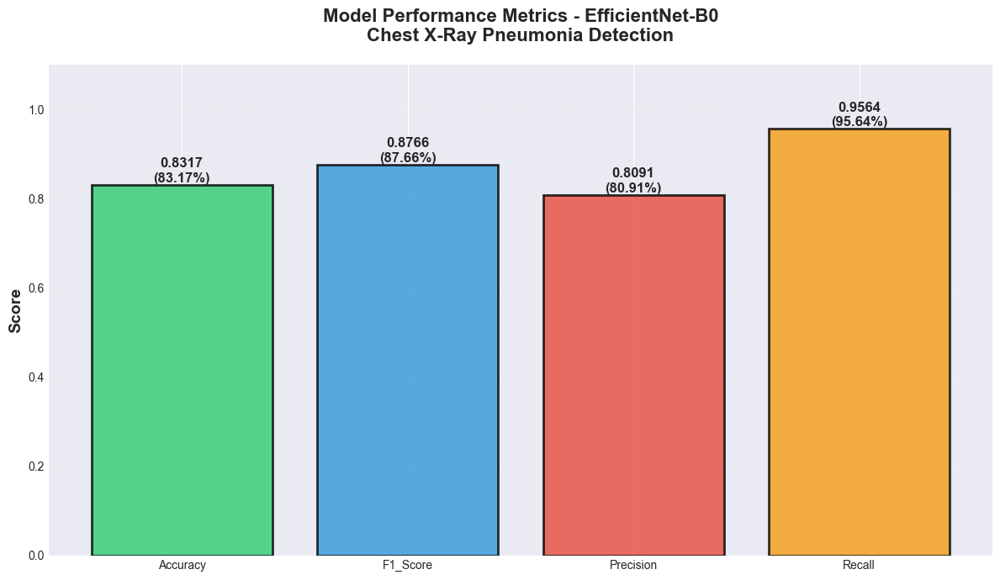

✅ Metrics bar chart saved to 'metrics_bar_chart.png'


In [73]:
# ============================================================================
# VISUALIZATION 2: METRICS BAR CHART
# ============================================================================

fig, ax = plt.subplots(figsize=(12, 7))
metrics_to_plot = ['Accuracy', 'F1_Score', 'Precision', 'Recall']
values = [results[m] for m in metrics_to_plot]
colors = ['#2ecc71', '#3498db', '#e74c3c', '#f39c12']

bars = ax.bar(metrics_to_plot, values, color=colors, alpha=0.8, edgecolor='black', linewidth=2)

# Add value labels on bars
for bar, value in zip(bars, values):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{value:.4f}\n({value*100:.2f}%)',
            ha='center', va='bottom', fontsize=12, fontweight='bold')

ax.set_ylim(0, 1.1)
ax.set_ylabel('Score', fontsize=14, fontweight='bold')
ax.set_title('Model Performance Metrics - EfficientNet-B0\nChest X-Ray Pneumonia Detection',
             fontsize=16, fontweight='bold', pad=20)
ax.grid(axis='y', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

plt.tight_layout()
plt.savefig('metrics_bar_chart.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Metrics bar chart saved to 'metrics_bar_chart.png'")

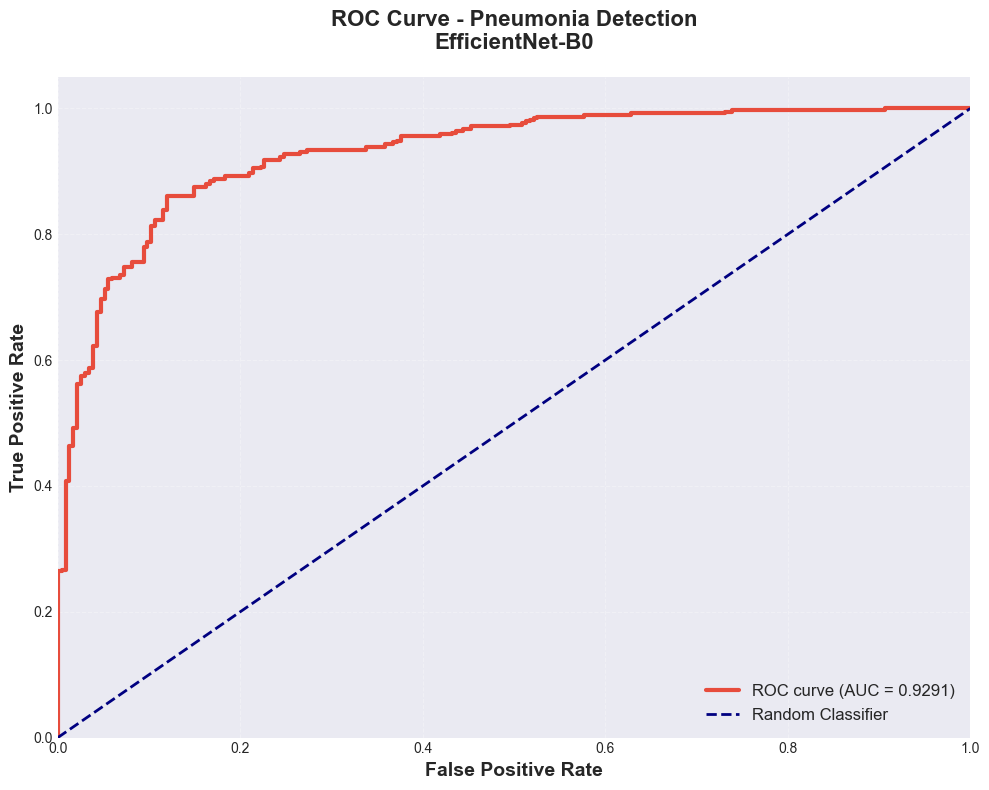

✅ ROC curve saved to 'roc_curve.png' (AUC = 0.9291)


In [74]:
# ============================================================================
# VISUALIZATION 3: ROC CURVE AND AUC
# ============================================================================

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(true_labels, pred_probs[:, 1])
roc_auc = auc(fpr, tpr)

fig, ax = plt.subplots(figsize=(10, 8))
ax.plot(fpr, tpr, color='#e74c3c', lw=3, label=f'ROC curve (AUC = {roc_auc:.4f})')
ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Classifier')
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate', fontsize=14, fontweight='bold')
ax.set_ylabel('True Positive Rate', fontsize=14, fontweight='bold')
ax.set_title('ROC Curve - Pneumonia Detection\nEfficientNet-B0',
             fontsize=16, fontweight='bold', pad=20)
ax.legend(loc="lower right", fontsize=12)
ax.grid(alpha=0.3, linestyle='--')

plt.tight_layout()
plt.savefig('roc_curve.png', dpi=300, bbox_inches='tight')
plt.show()
print(f"✅ ROC curve saved to 'roc_curve.png' (AUC = {roc_auc:.4f})")

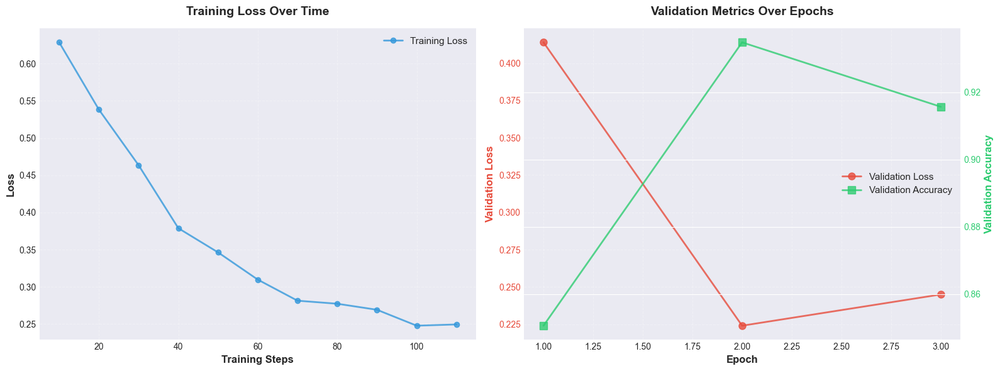

✅ Training history saved to 'training_history.png'


In [75]:
# ============================================================================
# VISUALIZATION 4: TRAINING HISTORY (Loss and Accuracy over Epochs)
# ============================================================================

# Extract training history from trainer state
import json

with open('efficientnet-b0-finetuned-chest-xray-pneumonia/trainer_state.json', 'r') as f:
    trainer_state = json.load(f)

log_history = trainer_state['log_history']

# Extract training and validation metrics
train_loss = []
train_steps = []
val_loss = []
val_accuracy = []
val_epochs = []

for entry in log_history:
    if 'loss' in entry:
        train_loss.append(entry['loss'])
        train_steps.append(entry['step'])
    if 'eval_loss' in entry:
        val_loss.append(entry['eval_loss'])
        val_accuracy.append(entry['eval_accuracy'])
        val_epochs.append(entry['epoch'])

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Loss over training steps
ax1.plot(train_steps, train_loss, 'o-', color='#3498db', linewidth=2,
         markersize=6, label='Training Loss', alpha=0.8)
ax1.set_xlabel('Training Steps', fontsize=12, fontweight='bold')
ax1.set_ylabel('Loss', fontsize=12, fontweight='bold')
ax1.set_title('Training Loss Over Time', fontsize=14, fontweight='bold', pad=15)
ax1.legend(fontsize=11)
ax1.grid(alpha=0.3, linestyle='--')

# Plot 2: Validation metrics over epochs
ax2_twin = ax2.twinx()
line1 = ax2.plot(val_epochs, val_loss, 'o-', color='#e74c3c', linewidth=2,
                 markersize=8, label='Validation Loss', alpha=0.8)
line2 = ax2_twin.plot(val_epochs, val_accuracy, 's-', color='#2ecc71', linewidth=2,
                      markersize=8, label='Validation Accuracy', alpha=0.8)

ax2.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax2.set_ylabel('Validation Loss', fontsize=12, fontweight='bold', color='#e74c3c')
ax2_twin.set_ylabel('Validation Accuracy', fontsize=12, fontweight='bold', color='#2ecc71')
ax2.set_title('Validation Metrics Over Epochs', fontsize=14, fontweight='bold', pad=15)
ax2.tick_params(axis='y', labelcolor='#e74c3c')
ax2_twin.tick_params(axis='y', labelcolor='#2ecc71')
ax2.grid(alpha=0.3, linestyle='--')

# Combine legends
lines = line1 + line2
labels = [l.get_label() for l in lines]
ax2.legend(lines, labels, loc='center right', fontsize=11)

plt.tight_layout()
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Training history saved to 'training_history.png'")

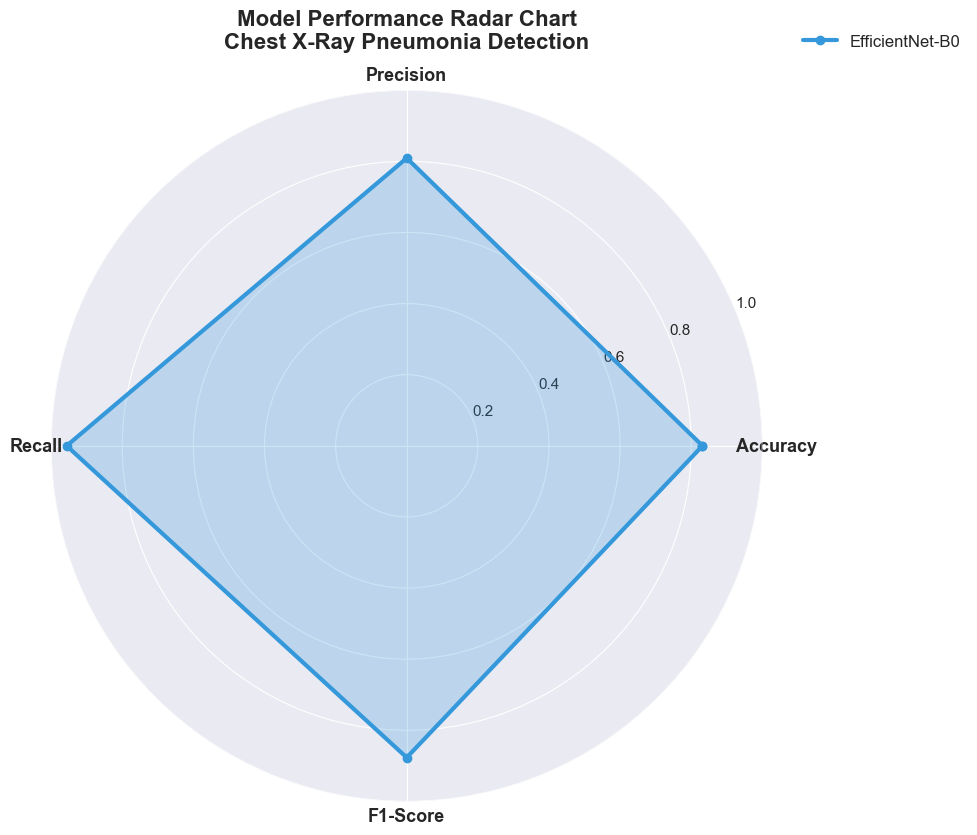

✅ Metrics radar chart saved to 'metrics_radar_chart.png'


In [76]:
# ============================================================================
# VISUALIZATION 5: METRICS COMPARISON RADAR CHART
# ============================================================================

from math import pi

# Prepare data for radar chart
categories = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
values = [results['Accuracy'], results['Precision'], results['Recall'], results['F1_Score']]

# Number of variables
N = len(categories)

# Compute angle for each axis
angles = [n / float(N) * 2 * pi for n in range(N)]
values += values[:1]  # Complete the circle
angles += angles[:1]

# Initialize the plot
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection='polar'))

# Draw the plot
ax.plot(angles, values, 'o-', linewidth=3, color='#3498db', label='EfficientNet-B0')
ax.fill(angles, values, alpha=0.25, color='#3498db')

# Fix axis to go in the right order
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=13, fontweight='bold')

# Set y-axis limits
ax.set_ylim(0, 1)
ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax.set_yticklabels(['0.2', '0.4', '0.6', '0.8', '1.0'], fontsize=11)

# Add title
plt.title('Model Performance Radar Chart\nChest X-Ray Pneumonia Detection',
          fontsize=16, fontweight='bold', pad=30)

# Add legend
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=12)

plt.tight_layout()
plt.savefig('metrics_radar_chart.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Metrics radar chart saved to 'metrics_radar_chart.png'")

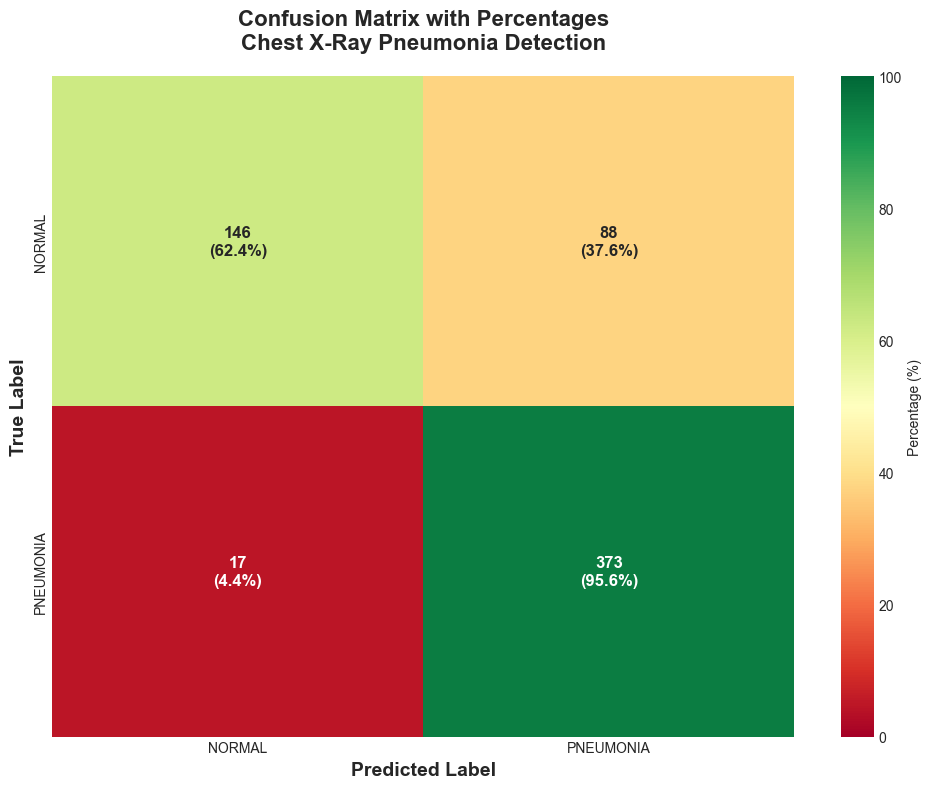

✅ Confusion matrix with percentages saved to 'confusion_matrix_percentage.png'


In [77]:
# ============================================================================
# VISUALIZATION 6: CONFUSION MATRIX WITH PERCENTAGES
# ============================================================================

fig, ax = plt.subplots(figsize=(10, 8))

# Calculate percentages
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# Create annotations with both count and percentage
annotations = np.empty_like(cm, dtype=object)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        annotations[i, j] = f'{cm[i, j]}\n({cm_percent[i, j]:.1f}%)'

sns.heatmap(cm_percent, annot=annotations, fmt='', cmap='RdYlGn',
            xticklabels=list(id2label.values()),
            yticklabels=list(id2label.values()),
            cbar_kws={'label': 'Percentage (%)'},
            ax=ax,
            annot_kws={'size': 12, 'weight': 'bold'},
            vmin=0, vmax=100)

plt.title('Confusion Matrix with Percentages\nChest X-Ray Pneumonia Detection',
          fontsize=16, fontweight='bold', pad=20)
plt.ylabel('True Label', fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('confusion_matrix_percentage.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Confusion matrix with percentages saved to 'confusion_matrix_percentage.png'")

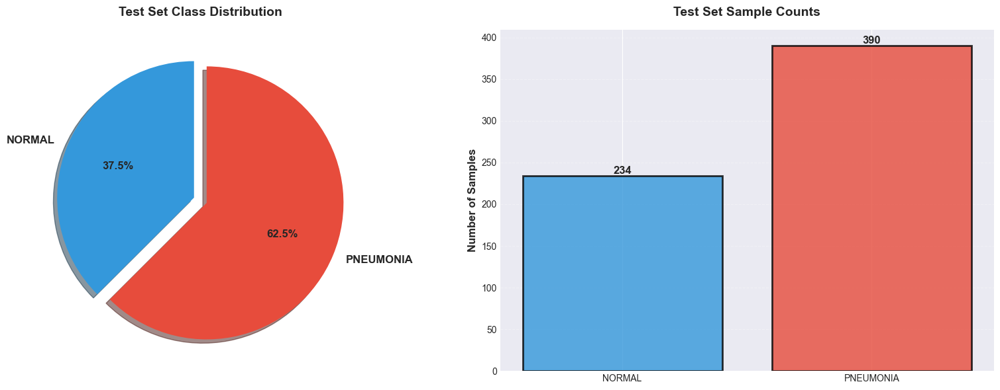

✅ Class distribution saved to 'class_distribution.png'


In [78]:
# ============================================================================
# VISUALIZATION 7: CLASS DISTRIBUTION IN TEST SET
# ============================================================================

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Count samples per class
unique, counts = np.unique(true_labels, return_counts=True)
class_names = [id2label[i] for i in unique]

# Pie chart
colors_pie = ['#3498db', '#e74c3c']
explode = (0.05, 0.05)
ax1.pie(counts, explode=explode, labels=class_names, autopct='%1.1f%%',
        shadow=True, startangle=90, colors=colors_pie, textprops={'fontsize': 12, 'weight': 'bold'})
ax1.set_title('Test Set Class Distribution', fontsize=14, fontweight='bold', pad=15)

# Bar chart
bars = ax2.bar(class_names, counts, color=colors_pie, alpha=0.8, edgecolor='black', linewidth=2)
ax2.set_ylabel('Number of Samples', fontsize=12, fontweight='bold')
ax2.set_title('Test Set Sample Counts', fontsize=14, fontweight='bold', pad=15)
ax2.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels on bars
for bar, count in zip(bars, counts):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(count)}',
            ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Class distribution saved to 'class_distribution.png'")

C:\Users\yash shinde\AppData\Local\Temp\ipykernel_20204\4182638539.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[1, 0].boxplot(data_to_plot, labels=['Correct', 'Incorrect'],
C:\Users\yash shinde\AppData\Local\Temp\ipykernel_20204\4182638539.py:56: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = axes[1, 1].boxplot(data_to_plot_class, labels=list(id2label.values()),


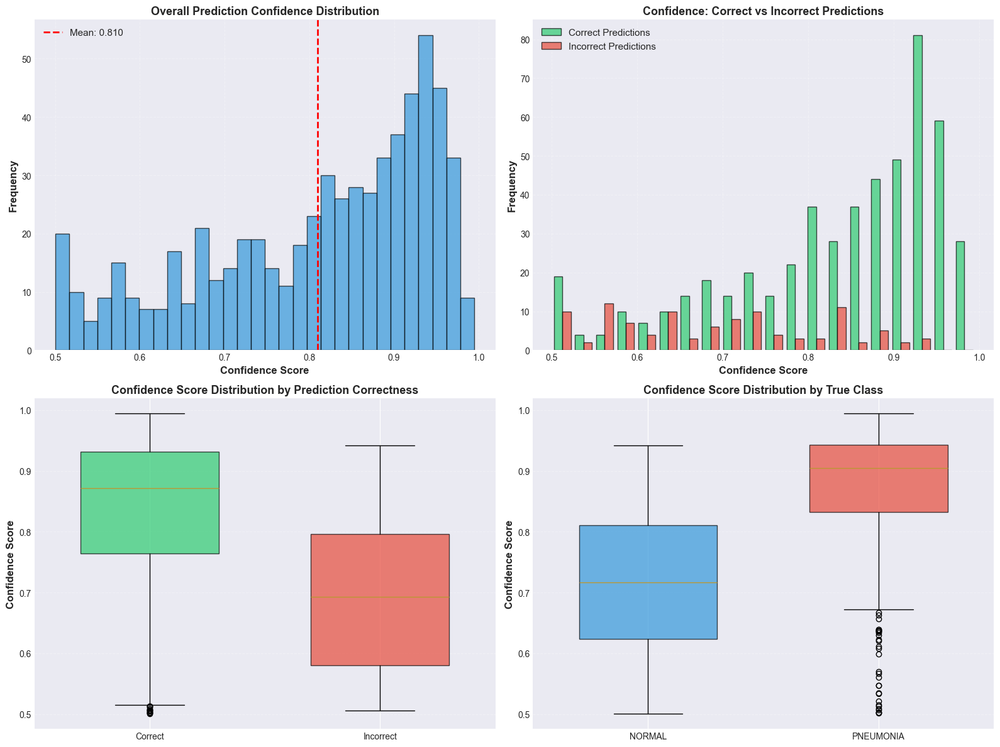

✅ Confidence distribution saved to 'confidence_distribution.png'

                    CONFIDENCE STATISTICS
Overall Mean Confidence: 0.8098
Correct Predictions Mean Confidence: 0.8333
Incorrect Predictions Mean Confidence: 0.6937
Number of Correct Predictions: 519 (83.17%)
Number of Incorrect Predictions: 105 (16.83%)


In [79]:
# ============================================================================
# VISUALIZATION 8: PREDICTION CONFIDENCE DISTRIBUTION
# ============================================================================

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Get max probabilities (confidence scores)
confidence_scores = np.max(pred_probs, axis=1)

# Separate correct and incorrect predictions
correct_mask = pred_labels == true_labels
incorrect_mask = ~correct_mask

correct_confidence = confidence_scores[correct_mask]
incorrect_confidence = confidence_scores[incorrect_mask]

# Plot 1: Overall confidence distribution
axes[0, 0].hist(confidence_scores, bins=30, color='#3498db', alpha=0.7, edgecolor='black')
axes[0, 0].axvline(confidence_scores.mean(), color='red', linestyle='--', linewidth=2,
                   label=f'Mean: {confidence_scores.mean():.3f}')
axes[0, 0].set_xlabel('Confidence Score', fontsize=12, fontweight='bold')
axes[0, 0].set_ylabel('Frequency', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Overall Prediction Confidence Distribution', fontsize=13, fontweight='bold')
axes[0, 0].legend(fontsize=11)
axes[0, 0].grid(alpha=0.3, linestyle='--')

# Plot 2: Correct vs Incorrect predictions
axes[0, 1].hist([correct_confidence, incorrect_confidence], bins=20,
                label=['Correct Predictions', 'Incorrect Predictions'],
                color=['#2ecc71', '#e74c3c'], alpha=0.7, edgecolor='black')
axes[0, 1].set_xlabel('Confidence Score', fontsize=12, fontweight='bold')
axes[0, 1].set_ylabel('Frequency', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Confidence: Correct vs Incorrect Predictions', fontsize=13, fontweight='bold')
axes[0, 1].legend(fontsize=11)
axes[0, 1].grid(alpha=0.3, linestyle='--')

# Plot 3: Box plot of confidence by correctness
data_to_plot = [correct_confidence, incorrect_confidence]
bp = axes[1, 0].boxplot(data_to_plot, labels=['Correct', 'Incorrect'],
                        patch_artist=True, widths=0.6)
for patch, color in zip(bp['boxes'], ['#2ecc71', '#e74c3c']):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
axes[1, 0].set_ylabel('Confidence Score', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Confidence Score Distribution by Prediction Correctness',
                     fontsize=13, fontweight='bold')
axes[1, 0].grid(axis='y', alpha=0.3, linestyle='--')

# Plot 4: Confidence by class
normal_mask = true_labels == 0
pneumonia_mask = true_labels == 1
normal_confidence = confidence_scores[normal_mask]
pneumonia_confidence = confidence_scores[pneumonia_mask]

data_to_plot_class = [normal_confidence, pneumonia_confidence]
bp2 = axes[1, 1].boxplot(data_to_plot_class, labels=list(id2label.values()),
                         patch_artist=True, widths=0.6)
for patch, color in zip(bp2['boxes'], ['#3498db', '#e74c3c']):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
axes[1, 1].set_ylabel('Confidence Score', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Confidence Score Distribution by True Class',
                     fontsize=13, fontweight='bold')
axes[1, 1].grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
plt.savefig('confidence_distribution.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Confidence distribution saved to 'confidence_distribution.png'")

# Print confidence statistics
print("\n" + "="*70)
print(" "*20 + "CONFIDENCE STATISTICS")
print("="*70)
print(f"Overall Mean Confidence: {confidence_scores.mean():.4f}")
print(f"Correct Predictions Mean Confidence: {correct_confidence.mean():.4f}")
print(f"Incorrect Predictions Mean Confidence: {incorrect_confidence.mean():.4f}")
print(f"Number of Correct Predictions: {correct_mask.sum()} ({correct_mask.sum()/len(true_labels)*100:.2f}%)")
print(f"Number of Incorrect Predictions: {incorrect_mask.sum()} ({incorrect_mask.sum()/len(true_labels)*100:.2f}%)")
print("="*70)

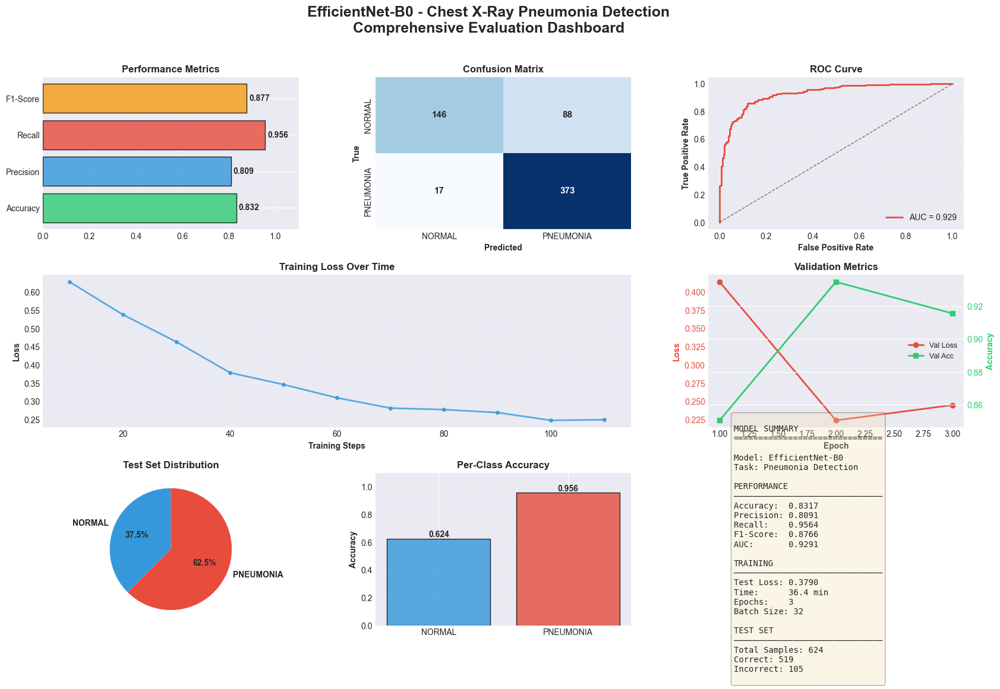

✅ Comprehensive dashboard saved to 'comprehensive_dashboard.png'


In [80]:
# ============================================================================
# VISUALIZATION 9: COMPREHENSIVE SUMMARY DASHBOARD
# ============================================================================

fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# 1. Metrics Bar Chart (Top Left)
ax1 = fig.add_subplot(gs[0, 0])
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [results['Accuracy'], results['Precision'], results['Recall'], results['F1_Score']]
colors_metrics = ['#2ecc71', '#3498db', '#e74c3c', '#f39c12']
bars = ax1.barh(metrics_names, metrics_values, color=colors_metrics, alpha=0.8, edgecolor='black')
for i, (bar, val) in enumerate(zip(bars, metrics_values)):
    ax1.text(val + 0.01, i, f'{val:.3f}', va='center', fontweight='bold', fontsize=10)
ax1.set_xlim(0, 1.1)
ax1.set_title('Performance Metrics', fontsize=12, fontweight='bold')
ax1.grid(axis='x', alpha=0.3, linestyle='--')

# 2. Confusion Matrix (Top Middle)
ax2 = fig.add_subplot(gs[0, 1])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax2, cbar=False,
            xticklabels=list(id2label.values()), yticklabels=list(id2label.values()),
            annot_kws={'size': 11, 'weight': 'bold'})
ax2.set_title('Confusion Matrix', fontsize=12, fontweight='bold')
ax2.set_ylabel('True', fontsize=10, fontweight='bold')
ax2.set_xlabel('Predicted', fontsize=10, fontweight='bold')

# 3. ROC Curve (Top Right)
ax3 = fig.add_subplot(gs[0, 2])
ax3.plot(fpr, tpr, color='#e74c3c', lw=2, label=f'AUC = {roc_auc:.3f}')
ax3.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
ax3.set_xlabel('False Positive Rate', fontsize=10, fontweight='bold')
ax3.set_ylabel('True Positive Rate', fontsize=10, fontweight='bold')
ax3.set_title('ROC Curve', fontsize=12, fontweight='bold')
ax3.legend(fontsize=10)
ax3.grid(alpha=0.3, linestyle='--')

# 4. Training Loss (Middle Left)
ax4 = fig.add_subplot(gs[1, :2])
ax4.plot(train_steps, train_loss, 'o-', color='#3498db', linewidth=2, markersize=4, alpha=0.8)
ax4.set_xlabel('Training Steps', fontsize=10, fontweight='bold')
ax4.set_ylabel('Loss', fontsize=10, fontweight='bold')
ax4.set_title('Training Loss Over Time', fontsize=12, fontweight='bold')
ax4.grid(alpha=0.3, linestyle='--')

# 5. Validation Metrics (Middle Right)
ax5 = fig.add_subplot(gs[1, 2])
ax5_twin = ax5.twinx()
line1 = ax5.plot(val_epochs, val_loss, 'o-', color='#e74c3c', linewidth=2,
                 markersize=6, label='Val Loss')
line2 = ax5_twin.plot(val_epochs, val_accuracy, 's-', color='#2ecc71', linewidth=2,
                      markersize=6, label='Val Acc')
ax5.set_xlabel('Epoch', fontsize=10, fontweight='bold')
ax5.set_ylabel('Loss', fontsize=10, fontweight='bold', color='#e74c3c')
ax5_twin.set_ylabel('Accuracy', fontsize=10, fontweight='bold', color='#2ecc71')
ax5.set_title('Validation Metrics', fontsize=12, fontweight='bold')
ax5.tick_params(axis='y', labelcolor='#e74c3c')
ax5_twin.tick_params(axis='y', labelcolor='#2ecc71')
lines = line1 + line2
labels = [l.get_label() for l in lines]
ax5.legend(lines, labels, loc='center right', fontsize=9)
ax5.grid(alpha=0.3, linestyle='--')

# 6. Class Distribution (Bottom Left)
ax6 = fig.add_subplot(gs[2, 0])
ax6.pie(counts, labels=class_names, autopct='%1.1f%%', colors=['#3498db', '#e74c3c'],
        textprops={'fontsize': 10, 'weight': 'bold'}, startangle=90)
ax6.set_title('Test Set Distribution', fontsize=12, fontweight='bold')

# 7. Per-Class Accuracy (Bottom Middle)
ax7 = fig.add_subplot(gs[2, 1])
class_accuracies = []
for i in range(len(id2label)):
    mask = true_labels == i
    class_acc = (pred_labels[mask] == true_labels[mask]).mean()
    class_accuracies.append(class_acc)
bars = ax7.bar(list(id2label.values()), class_accuracies,
               color=['#3498db', '#e74c3c'], alpha=0.8, edgecolor='black')
for bar, acc in zip(bars, class_accuracies):
    height = bar.get_height()
    ax7.text(bar.get_x() + bar.get_width()/2., height,
            f'{acc:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=10)
ax7.set_ylabel('Accuracy', fontsize=10, fontweight='bold')
ax7.set_title('Per-Class Accuracy', fontsize=12, fontweight='bold')
ax7.set_ylim(0, 1.1)
ax7.grid(axis='y', alpha=0.3, linestyle='--')

# 8. Model Info (Bottom Right)
ax8 = fig.add_subplot(gs[2, 2])
ax8.axis('off')
info_text = f"""
MODEL SUMMARY
{'='*30}

Model: EfficientNet-B0
Task: Pneumonia Detection

PERFORMANCE
{'─'*30}
Accuracy:  {results['Accuracy']:.4f}
Precision: {results['Precision']:.4f}
Recall:    {results['Recall']:.4f}
F1-Score:  {results['F1_Score']:.4f}
AUC:       {roc_auc:.4f}

TRAINING
{'─'*30}
Test Loss: {results['Test_Loss']:.4f}
Time:      {results['Training_Time_s']/60:.1f} min
Epochs:    3
Batch Size: 32

TEST SET
{'─'*30}
Total Samples: {len(true_labels)}
Correct: {correct_mask.sum()}
Incorrect: {incorrect_mask.sum()}
"""
ax8.text(0.1, 0.5, info_text, fontsize=10, family='monospace',
         verticalalignment='center', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))

# Main title
fig.suptitle('EfficientNet-B0 - Chest X-Ray Pneumonia Detection\nComprehensive Evaluation Dashboard',
             fontsize=18, fontweight='bold', y=0.98)

plt.savefig('comprehensive_dashboard.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Comprehensive dashboard saved to 'comprehensive_dashboard.png'")


               📊 EVALUATION COMPLETE - ALL VISUALIZATIONS SAVED

Generated Files:
  1. ✅ model_evaluation_results.csv - Metrics in CSV format
  2. ✅ confusion_matrix.png - Confusion matrix heatmap
  3. ✅ metrics_bar_chart.png - Performance metrics bar chart
  4. ✅ roc_curve.png - ROC curve with AUC
  5. ✅ training_history.png - Training and validation history
  6. ✅ metrics_radar_chart.png - Radar chart of metrics
  7. ✅ confusion_matrix_percentage.png - Confusion matrix with percentages
  8. ✅ class_distribution.png - Test set class distribution
  9. ✅ confidence_distribution.png - Prediction confidence analysis
 10. ✅ comprehensive_dashboard.png - Complete evaluation dashboard

✅ Detailed report saved to 'evaluation_report.txt'

🎉 All evaluations completed successfully!


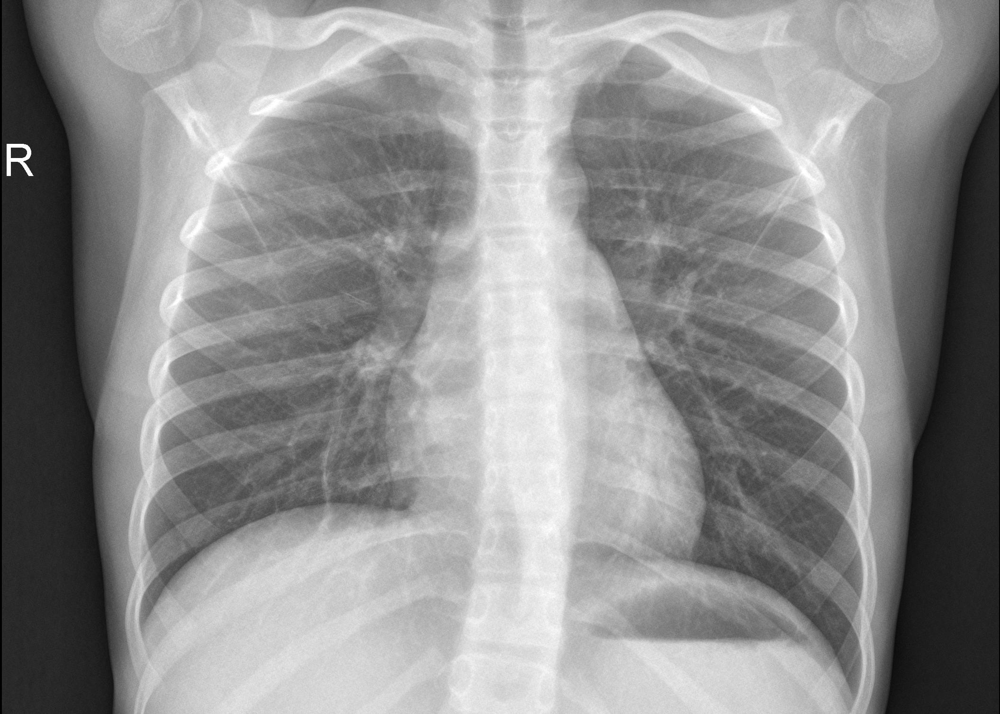

In [81]:
# ============================================================================
# FINAL SUMMARY: SAVE ALL RESULTS
# ============================================================================

print("\n" + "="*70)
print(" "*15 + "📊 EVALUATION COMPLETE - ALL VISUALIZATIONS SAVED")
print("="*70)
print("\nGenerated Files:")
print("  1. ✅ model_evaluation_results.csv - Metrics in CSV format")
print("  2. ✅ confusion_matrix.png - Confusion matrix heatmap")
print("  3. ✅ metrics_bar_chart.png - Performance metrics bar chart")
print("  4. ✅ roc_curve.png - ROC curve with AUC")
print("  5. ✅ training_history.png - Training and validation history")
print("  6. ✅ metrics_radar_chart.png - Radar chart of metrics")
print("  7. ✅ confusion_matrix_percentage.png - Confusion matrix with percentages")
print("  8. ✅ class_distribution.png - Test set class distribution")
print("  9. ✅ confidence_distribution.png - Prediction confidence analysis")
print(" 10. ✅ comprehensive_dashboard.png - Complete evaluation dashboard")
print("="*70)

# Save detailed results to text file
with open('evaluation_report.txt', 'w') as f:
    f.write("="*70 + "\n")
    f.write(" "*15 + "MODEL EVALUATION REPORT\n")
    f.write("="*70 + "\n\n")
    f.write(f"Model: {results['Model']}\n")
    f.write(f"Task: Chest X-Ray Pneumonia Detection\n")
    f.write(f"Date: {pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    f.write("="*70 + "\n")
    f.write("PERFORMANCE METRICS\n")
    f.write("="*70 + "\n")
    f.write(f"Accuracy:       {results['Accuracy']:.4f} ({results['Accuracy']*100:.2f}%)\n")
    f.write(f"Precision:      {results['Precision']:.4f} ({results['Precision']*100:.2f}%)\n")
    f.write(f"Recall:         {results['Recall']:.4f} ({results['Recall']*100:.2f}%)\n")
    f.write(f"F1-Score:       {results['F1_Score']:.4f} ({results['F1_Score']*100:.2f}%)\n")
    f.write(f"AUC-ROC:        {roc_auc:.4f}\n")
    f.write(f"Test Loss:      {results['Test_Loss']:.4f}\n")
    f.write(f"Training Time:  {results['Training_Time_s']:.2f} seconds ({results['Training_Time_s']/60:.2f} minutes)\n\n")
    f.write("="*70 + "\n")
    f.write("CONFUSION MATRIX\n")
    f.write("="*70 + "\n")
    f.write(cm_df.to_string())
    f.write("\n\n")
    f.write("="*70 + "\n")
    f.write("CLASSIFICATION REPORT\n")
    f.write("="*70 + "\n")
    f.write(classification_report(true_labels, pred_labels,
                                  target_names=list(id2label.values()),
                                  digits=4))

print("\n✅ Detailed report saved to 'evaluation_report.txt'")
print("\n🎉 All evaluations completed successfully!")

image

In [82]:
from transformers import AutoModelForImageClassification, AutoImageProcessor

repo_name = "yashshinde0080/efficientnet-b0-finetuned-chest-xray-pneumonia"

image_processor = AutoImageProcessor.from_pretrained(repo_name)
model = AutoModelForImageClassification.from_pretrained(repo_name)

In [83]:
# prepare image for the model
encoding = image_processor(image.convert("RGB"), return_tensors="pt")
print(encoding.pixel_values.shape)

torch.Size([1, 3, 224, 224])


In [84]:
import torch

# forward pass
with torch.no_grad():
    outputs = model(**encoding)
    logits = outputs.logits

In [85]:
predicted_class_idx = logits.argmax(-1).item()
print("Predicted class:", model.config.id2label[predicted_class_idx])

Predicted class: PNEUMONIA


In [86]:
from transformers import pipeline

pipe = pipeline("image-classification", "yashshinde0080/efficientnet-b0-finetuned-chest-xray-pneumonia")

Device set to use cpu


In [87]:
pipe(image)

[{'label': 'PNEUMONIA', 'score': 0.6095772981643677},
 {'label': 'NORMAL', 'score': 0.39042264223098755}]

In [88]:
pipe = pipeline("image-classification",
                model=model,
                feature_extractor=image_processor)

Device set to use cpu


In [89]:
pipe(image)

[{'label': 'PNEUMONIA', 'score': 0.6095772981643677},
 {'label': 'NORMAL', 'score': 0.39042264223098755}]